In [2]:
# version 0.1
import cv2
import math
import numpy as np
import matplotlib.pyplot as plt

def detect_and_compute(img_gray, n_features=2000):
    orb = cv2.ORB_create(nfeatures=n_features)
    kp, des = orb.detectAndCompute(img_gray, None)
    return kp, des

def match_features(des1, des2):
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    return sorted(matches, key=lambda x: x.distance)

def select_good_matches(matches, ratio=0.25, min_count=10, max_count=50):
    num = int(min(max_count, max(min_count, len(matches) * ratio)))
    return matches[:num]

def estimate_affine_transform(kp1, kp2, matches):
    if len(matches) < 4:
        return None
    pts1 = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    pts2 = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    M, _ = cv2.estimateAffinePartial2D(pts1, pts2, method=cv2.RANSAC)
    return M

def extract_rotation_angle(M):
    if M is None:
        return 0.0
    angle_rad = math.atan2(M[1, 0], M[0, 0])
    return math.degrees(angle_rad)

def rotate_image(img, angle):
    h, w = img.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    return cv2.warpAffine(img, M, (w, h), borderMode=cv2.BORDER_CONSTANT, borderValue=(255, 255, 255))

def visualize_results(img1, img2, img3, titles):
    plt.style.use('seaborn-v0_8-whitegrid')
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    for ax, im, title in zip(axes, (img1, img2, img3), titles):
        ax.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
        ax.set_title(title)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

def calculate_rotation_for_loaded_images(img1_gray, img2_gray, img1_bgr, img2_bgr):
    kp1, des1 = detect_and_compute(img1_gray)
    kp2, des2 = detect_and_compute(img2_gray)
    if des1 is None or des2 is None:
        return 0.0
    matches = match_features(des1, des2)
    good_matches = select_good_matches(matches)
    M = estimate_affine_transform(kp1, kp2, good_matches)
    angle = extract_rotation_angle(M)
    img3_bgr = rotate_image(img2_bgr, angle)
    visualize_results(img1_bgr, img2_bgr, img3_bgr, ['Image 1', 'Image 2', f'Image 2 Rotated {angle:.2f}°'])
    return angle

# 示例生成测试图像
def create_dummy_images_for_testing(index_val):
    base_img_gray = np.zeros((300, 400), dtype=np.uint8)
    cv2.rectangle(base_img_gray, (50, 100), (200, 200), 200, -1)
    cv2.line(base_img_gray, (50,100), (125,50), 100, 5)
    cv2.putText(base_img_gray, f"Orig {index_val}", (60, 160), cv2.FONT_HERSHEY_SIMPLEX, 1, 0, 2)

    test_angles = [0, 30, -45, 60, 190]
    angle = test_angles[(index_val -1) % len(test_angles)]
    rows, cols = base_img_gray.shape
    M_rot = cv2.getRotationMatrix2D((cols//2, rows//2), angle, 1.0)
    dist_img_gray = cv2.warpAffine(base_img_gray, M_rot, (cols, rows), borderValue=10)
    cv2.putText(dist_img_gray, f"Dist {index_val}", (60, 160), cv2.FONT_HERSHEY_SIMPLEX, 1, 0, 2)

    if index_val % 2 == 0:
        pts1 = np.float32([[0,0],[cols-1,0],[0,rows-1],[cols-1,rows-1]])
        shift = index_val * 3
        pts2 = np.float32([[shift,shift],[cols-1-shift,0],[0,rows-1-shift],[cols-1,rows-1]])
        M_persp = cv2.getPerspectiveTransform(pts1, pts2)
        dist_img_gray = cv2.warpPerspective(dist_img_gray, M_persp, (cols, rows), borderValue=15)

    orig_bgr = cv2.cvtColor(base_img_gray, cv2.COLOR_GRAY2BGR)
    dist_bgr = cv2.cvtColor(dist_img_gray, cv2.COLOR_GRAY2BGR)
    return base_img_gray, dist_img_gray, orig_bgr, dist_bgr, angle



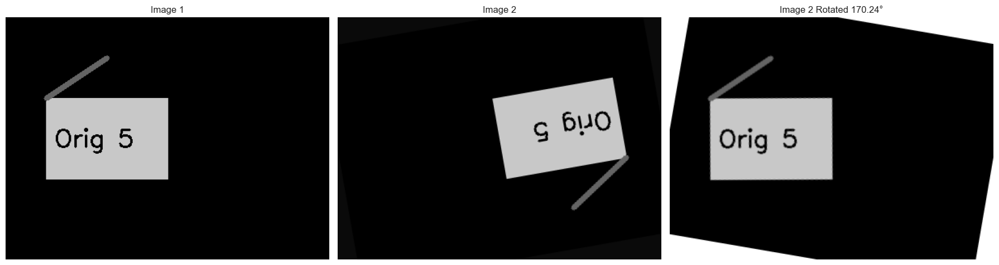

In [8]:
# for i in range(1, 4):
#     orig_gray, dist_gray, orig_bgr, dist_bgr, true_angle = create_dummy_images_for_testing(i)
#     print(f"\n--- Test {i} --- True CCW angle: {true_angle}°")
#     angle = calculate_rotation_for_loaded_images(orig_gray, dist_gray, orig_bgr, dist_bgr)
#     print(f"Estimated CCW rotation: {angle:.2f}°")

i = 5
orig_gray, dist_gray, orig_bgr, dist_bgr, true_angle = create_dummy_images_for_testing(i)
angle = calculate_rotation_for_loaded_images(orig_gray, dist_gray, orig_bgr, dist_bgr)





In [ ]:


# my images
def ensure_bgr_from_gray(gray_img):
    """
    Convert a grayscale image to BGR format if needed.

    Args:
        gray_img (numpy.ndarray): Grayscale image (2D).

    Returns:
        numpy.ndarray: BGR image (3D) for display purposes.
    """
    if len(gray_img.shape) == 2:  # it's grayscale
        return cv2.cvtColor(gray_img, cv2.COLOR_GRAY2BGR)
    return gray_img  # already BGR


orig = cv2.imread('cc/original_shape_3.png', cv2.IMREAD_GRAYSCALE)
dist = cv2.imread('demo.images/distorted_shape_3.png', cv2.IMREAD_GRAYSCALE)

orig_bgr = ensure_bgr_from_gray(orig)
dist_bgr = ensure_bgr_from_gray(dist)

angle = calculate_rotation_for_loaded_images(orig, dist, orig_bgr, dist_bgr)

# Try Copilot's method
Angle error is too too large


I have some H&E images just like the uploaded one. The image1 is before expansion and image2 is after expansion. So the expansion may induce a mild distortion. And image1 and image2 are in different orientation because they are imaged by microscopy respectively. Help me write a python code to complete the tasks.
1. Read the image1 and image2 (in .png format).
2. Extract the orientation of the sample in image1 and image2.
3. Estimate the rotation angle from image1 to image2.
4. Rotate the image2 to the same orientation of image1, named as image3.
5. Plotting image1-3 with the angle labeled to visulize your results.
Maybe you should denoise or something before your processes? Maybe you should extract the significant geometrical shape feature? I'm not sure, do not influenced by me. But you should help a beginner to finished these tasks. And I want you to write the code in one code box, with English notes.


In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to adjust the angle returned by cv2.minAreaRect.
# OpenCV returns angles in the range [-90, 0). If the angle is less than -45, we add 90.
def get_corrected_angle(rect):
    angle = rect[-1]
    if angle < -45:
        angle += 90
    return angle

# Function to extract the sample orientation.
# This function converts the image to grayscale, denoises it with Gaussian blur,
# thresholds it (using Otsu's method) and performs a simple morphological opening,
# then finds the largest contour and extracts its orientation using minAreaRect.
def extract_orientation(img):
    # Convert image to grayscale (if the image is in color)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Apply Gaussian blur to reduce noise
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Use Otsu's thresholding to create a binary image
    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Optional: Clean up small noise using a morphological opening operation
    kernel = np.ones((3, 3), np.uint8)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
    
    # Find contours from the binary image
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        raise ValueError("No contours found in the image.")
    
    # Assume the largest contour corresponds to the tissue/sample
    largest_contour = max(contours, key=cv2.contourArea)
    
    # Compute the minimum-area bounding rotated rectangle
    rect = cv2.minAreaRect(largest_contour)
    
    # Get the corrected angle from the rectangle
    angle = get_corrected_angle(rect)
    
    return angle, rect


In [11]:
# Read the images (adjust the paths if necessary)
img1 = cv2.imread('image1.png')  # image before expansion
img2 = cv2.imread('image2.png')  # image after expansion

# Check if images were correctly loaded
if img1 is None or img2 is None:
    raise FileNotFoundError("Make sure image1.png and image2.png exist in the working directory.")


In [14]:
# Extract orientations for image1 and image2
angle1, rect1 = extract_orientation(img1)
angle2, rect2 = extract_orientation(img2)
print(f"Image1 orientation: {angle1:.2f} degrees")
print(f"Image2 orientation: {angle2:.2f} degrees")



Image1 orientation: 28.04 degrees
Image2 orientation: 90.00 degrees


Rotation needed (to align image2 to image1): -5.02 degrees


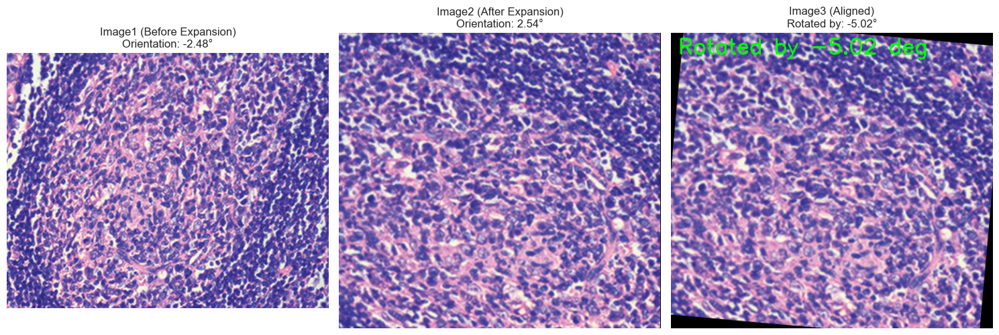

In [25]:
# Estimate the rotation angle needed to align image2 to image1.
# To align image2 with image1 we rotate image2 by (angle1 - angle2)
rotation_needed = angle1 - angle2
print(f"Rotation needed (to align image2 to image1): {rotation_needed:.2f} degrees")

# Rotate image2 using the computed angle.
(h, w) = img2.shape[:2]
center = (w // 2, h // 2)
# OpenCV rotates in a counter-clockwise direction when using positive angles.
M = cv2.getRotationMatrix2D(center, rotation_needed, 1.0)
img3 = cv2.warpAffine(img2, M, (w, h))

# Optionally, label the rotated image (image3) with the rotation angle text.
cv2.putText(img3, f"Rotated by {rotation_needed:.2f} deg", (10, 30),
            cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

# Plot the original and aligned images using matplotlib.
# Since OpenCV uses BGR ordering and matplotlib uses RGB, we convert the images.
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img3_rgb = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 5))

# Show image1
plt.subplot(1, 3, 1)
plt.imshow(img1_rgb)
plt.title(f"Image1 (Before Expansion)\nOrientation: {angle1:.2f}°")
plt.axis('off')

# Show image2
plt.subplot(1, 3, 2)
plt.imshow(img2_rgb)
plt.title(f"Image2 (After Expansion)\nOrientation: {angle2:.2f}°")
plt.axis('off')

# Show image3 (aligned)
plt.subplot(1, 3, 3)
plt.imshow(img3_rgb)
plt.title(f"Image3 (Aligned)\nRotated by: {rotation_needed:.2f}°")
plt.axis('off')

plt.tight_layout()
plt.show()


# Try DeepSeek's code
Angle error is too too too large

In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def read_image(path):
    """Read image in RGB format"""
    img = cv2.imread(path)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def get_orientation(image):
    """
    Extract dominant orientation using PCA on edge pixels
    Returns angle in degrees (-90 to 90)
    """
    # Convert to grayscale and denoise
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Edge detection
    edges = cv2.Canny(blurred, 50, 150)
    
    # Get edge coordinates
    y, x = np.where(edges > 0)
    if len(x) < 2:
        return 0.0  # Not enough points for PCA
    
    # Perform PCA on edge coordinates
    pca = PCA(n_components=2)
    pca.fit(np.column_stack((x, y)))
    
    # Calculate angle from first principal component
    dx, dy = pca.components_[0]
    angle = np.degrees(np.arctan2(dy, dx))
    
    # Convert to (-90, 90) range
    angle = angle % 180
    if angle > 90:
        angle -= 180
    return angle

def rotate_image(image, angle):
    """Rotate image about center with full content visible"""
    h, w = image.shape[:2]
    center = (w//2, h//2)
    
    # Get rotation matrix
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    
    # Calculate new bounds
    cos = np.abs(M[0, 0])
    sin = np.abs(M[0, 1])
    new_w = int((h * sin) + (w * cos))
    new_h = int((h * cos) + (w * sin))
    
    # Adjust translation
    M[0, 2] += (new_w - w) / 2
    M[1, 2] += (new_h - h) / 2
    
    # Apply rotation
    return cv2.warpAffine(image, M, (new_w, new_h), 
                         borderMode=cv2.BORDER_REPLICATE)



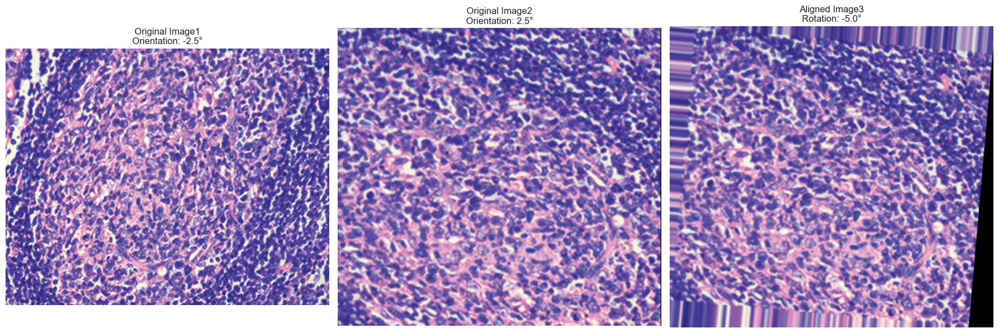

In [24]:
# 1. Read images
image1 = read_image('image1.png')
image2 = read_image('image2.png')

# 2. Extract orientations
angle1 = get_orientation(image1)
angle2 = get_orientation(image2)

# 3. Calculate rotation angle (adjusted for minimal rotation)
rotation_angle = angle1 - angle2
rotation_angle = (rotation_angle + 90) % 180 - 90  # Keep in [-90, 90]

# 4. Rotate image2
image3 = rotate_image(image2, rotation_angle)

# 5. Plot results
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
titles = [
    f'Original Image1\nOrientation: {angle1:.1f}°',
    f'Original Image2\nOrientation: {angle2:.1f}°',
    f'Aligned Image3\nRotation: {rotation_angle:.1f}°'
]

for ax, img, title in zip(axes, [image1, image2, image3], titles):
    ax.imshow(img)
    ax.set_title(title, fontsize=12)
    ax.axis('off')

plt.tight_layout()
plt.show()

# Perplexity's method

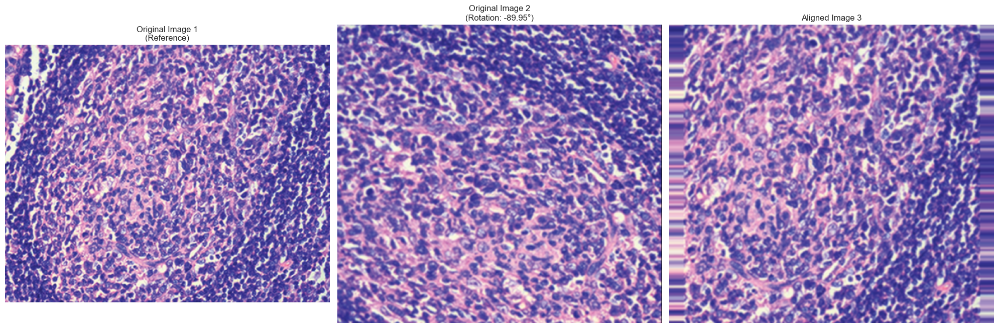

In [33]:
# Import required libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt

def align_images(image1_path, image2_path):
    """Main function to align two microscopy images with rotational differences"""
    
    # 1. Read images in RGB format
    img1 = cv2.cvtColor(cv2.imread(image1_path), cv2.COLOR_BGR2RGB)
    img2 = cv2.cvtColor(cv2.imread(image2_path), cv2.COLOR_BGR2RGB)
    
    # Optional denoising - helps with feature detection
    img1_clean = cv2.medianBlur(img1, 5)
    img2_clean = cv2.medianBlur(img2, 5)
    
    # 2. Feature extraction using ORB detector
    orb = cv2.ORB_create(nfeatures=2000)
    kp1, des1 = orb.detectAndCompute(img1_clean, None)
    kp2, des2 = orb.detectAndCompute(img2_clean, None)
    
    # Feature matching with FLANN
    matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = matcher.match(des1, des2)
    
    # Sort matches by distance and keep top 15%
    matches = sorted(matches, key=lambda x: x.distance)
    keep = int(len(matches) * 0.15)
    good_matches = matches[:keep]
    
    # 3. Calculate homography matrix using RANSAC
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1,1,2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1,1,2)
    
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    
    # 4. Calculate rotation angle from homography matrix
    rotation_rad = np.arctan2(H[1,0], H[0,0])
    rotation_deg = np.degrees(rotation_rad)
    
    # 5. Rotate image2 to match image1 orientation
    (h, w) = img2.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, rotation_deg, 1.0)
    img3 = cv2.warpAffine(img2, M, (w, h),
                         flags=cv2.INTER_LINEAR,
                         borderMode=cv2.BORDER_REPLICATE)
    
    # 6. Visualization
    fig, ax = plt.subplots(1, 3, figsize=(20, 10))
    ax[0].imshow(img1)
    ax[0].set_title('Original Image 1\n(Reference)')
    ax[0].axis('off')
    
    ax[1].imshow(img2)
    ax[1].set_title(f'Original Image 2\n(Rotation: {rotation_deg:.2f}°)')
    ax[1].axis('off')
    
    ax[2].imshow(img3)
    ax[2].set_title('Aligned Image 3')
    ax[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return img3, rotation_deg

# Example usage
image3, angle = align_images("image1.png", "image2.png")


# Try Grok's method
Rotate diverse. To have a check.

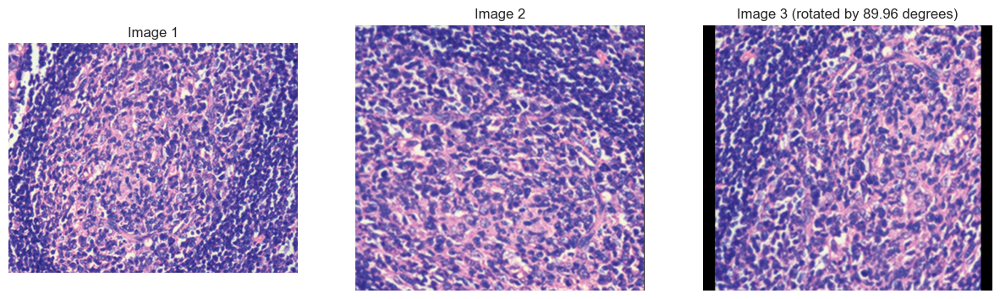

In [19]:
import cv2                 # OpenCV library for image processing
import numpy as np         # NumPy library for numerical operations
import matplotlib.pyplot as plt  # Matplotlib for plotting images

# Step 1: Read the two images from files
# Replace 'image1.png' and 'image2.png' with your actual file names
img1 = cv2.imread('image1.png')  # Image before expansion
img2 = cv2.imread('image2.png')  # Image after expansion

# Step 2: Convert images to grayscale
# Grayscale simplifies feature detection
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Step 3: Apply Gaussian blur to reduce noise
# This helps improve feature detection by smoothing the images
blur1 = cv2.GaussianBlur(gray1, (5, 5), 0)  # Kernel size (5,5), sigma=0
blur2 = cv2.GaussianBlur(gray2, (5, 5), 0)

# Step 4: Initialize ORB detector
# ORB (Oriented FAST and Rotated BRIEF) detects keypoints and descriptors
orb = cv2.ORB_create()

# Step 5: Find keypoints and descriptors in both images
# Keypoints are interesting points, descriptors describe them
kp1, des1 = orb.detectAndCompute(blur1, None)  # For image 1
kp2, des2 = orb.detectAndCompute(blur2, None)  # For image 2

# Step 6: Create a Brute-Force Matcher with Hamming distance
# Hamming distance is suitable for binary descriptors like ORB
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
# crossCheck=True ensures mutual best matches

# Step 7: Match descriptors between the two images
matches = bf.match(des1, des2)

# Step 8: Sort matches by distance
# Lower distance means better match
matches = sorted(matches, key=lambda x: x.distance)

# Step 9: Extract the coordinates of matched points
# These points will be used to estimate the transformation
src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)  # Points from image 1
dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)  # Points from image 2

# Step 10: Estimate the affine transformation between the images
# Uses RANSAC to robustly handle outliers in matches
M, inliers = cv2.estimateAffinePartial2D(src_pts, dst_pts, method=cv2.RANSAC)

# Step 11: Check if transformation was successfully estimated
if M is not None:
    # Extract rotation angle from the affine matrix
    # M is a 2x3 matrix: [[cosθ, -sinθ, tx], [sinθ, cosθ, ty]]
    theta = np.arctan2(M[1, 0], M[0, 0])  # Angle in radians
    theta_deg = np.degrees(theta)         # Convert to degrees

    # Step 12: Rotate the second image to match the first
    h, w = img2.shape[:2]                 # Get height and width of image 2
    center = (w // 2, h // 2)             # Rotation center (image center)
    rot_mat = cv2.getRotationMatrix2D(center, -theta_deg, 1.0)  # Rotation matrix, negative angle to align
    img3 = cv2.warpAffine(img2, rot_mat, (w, h))  # Apply rotation to image 2

    # Step 13: Visualize the results
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Create a figure with 3 subplots

    # Display Image 1 (original before expansion)
    axes[0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct colors
    axes[0].set_title('Image 1')
    axes[0].axis('off')  # Hide axes

    # Display Image 2 (original after expansion)
    axes[1].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Image 2')
    axes[1].axis('off')

    # Display Image 3 (image 2 rotated to match image 1)
    axes[2].imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB))
    axes[2].set_title(f'Image 3 (rotated by {-theta_deg:.2f} degrees)')
    axes[2].axis('off')

    plt.show()  # Show the plot
else:
    print("Could not estimate transformation. Not enough good matches.")

# Try Gemini's method
Angle error is too too too large

Preprocessing image 1...
Preprocessing image 2...
Extracting orientation from image 1...
Extracting orientation from image 2...
Orientation of sample in Image 1: -75.36 degrees
Orientation of sample in Image 2: 20.94 degrees
Estimated rotation angle from Image 2 to Image 1: -96.30 degrees


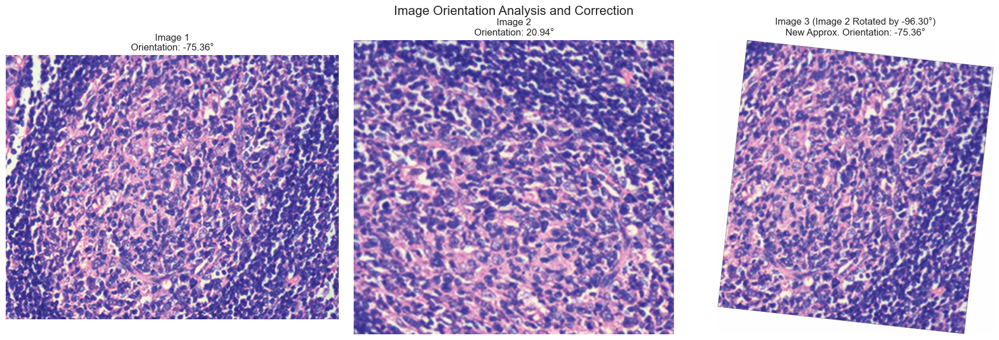

In [27]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import rotate
from skimage.io import imread

def get_orientation_pca(image_gray):
    """
    Extracts the orientation of the largest contour in a grayscale image using PCA.

    Args:
        image_gray (numpy.ndarray): Grayscale input image.

    Returns:
        float: Angle of the major axis in degrees. Returns None if no contours are found.
    """
    # Find contours
    # We use RETR_EXTERNAL to retrieve only the outer contours and CHAIN_APPROX_SIMPLE to compress segments.
    contours, _ = cv2.findContours(image_gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if not contours:
        print("No contours found.")
        return None

    # Assume the largest contour is the sample
    largest_contour = max(contours, key=cv2.contourArea)

    # Convert contour points to a NumPy array
    points = largest_contour.reshape(-1, 2).astype(np.float32)

    if len(points) < 5: # PCA needs at least 5 points for fitEllipse, or generally for meaningful analysis
        print("Not enough points in the largest contour for PCA.")
        return None

    # Perform PCA
    mean, eigenvectors = cv2.PCACompute(points, mean=None) # OpenCV's PCACompute expects data as rows

    # The first eigenvector corresponds to the major axis
    # Angle of the first principal component (eigenvector)
    # The eigenvectors array has shape (ncomponents, nfeatures). Here, (2, 2)
    # The first row eigenvectors[0,:] is the primary principal component
    angle_rad = np.arctan2(eigenvectors[0, 1], eigenvectors[0, 0])
    angle_deg = np.degrees(angle_rad)

    return angle_deg

def preprocess_image(image):
    """
    Preprocesses the image: convert to grayscale, apply Gaussian blur, and threshold.

    Args:
        image (numpy.ndarray): Input color image.

    Returns:
        numpy.ndarray: Preprocessed binary image.
    """
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur to reduce noise and improve contour detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Threshold the image to get a binary image.
    # OTSU's method automatically determines the optimal threshold value.
    _, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    # We use THRESH_BINARY_INV because typically H&E stains the nuclei/tissue dark,
    # and we want the tissue to be white for contour detection.
    # If your sample is lighter than the background, you might use THRESH_BINARY.

    return thresh

def main():
    # --- 1. Read the image1 and image2 ---
    try:
        image1_orig = imread('image1.png') # Ensure image1.png is in the same directory or provide full path
        image2_orig = imread('image2.png') # Ensure image2.png is in the same directory or provide full path
    except FileNotFoundError:
        print("Error: Make sure 'image1.png' and 'image2.png' are in the correct directory.")
        # Create dummy images for testing if files are not found
        print("Creating dummy images for demonstration purposes.")
        image1_orig = np.zeros((200, 300, 3), dtype=np.uint8)
        cv2.ellipse(image1_orig, (150,100), (80,30), 30, 0, 360, (255,100,100), -1) # Light red ellipse
        image1_orig = cv2.cvtColor(image1_orig, cv2.COLOR_BGR2RGB) # imread reads as RGB, ensure consistency

        image2_orig = np.zeros((250, 350, 3), dtype=np.uint8)
        cv2.ellipse(image2_orig, (170,120), (90,35), -45, 0, 360, (100,100,255), -1) # Light blue ellipse
        image2_orig = cv2.cvtColor(image2_orig, cv2.COLOR_BGR2RGB) # imread reads as RGB

        # Save dummy images if you want to see them
        # plt.imsave('image1.png', image1_orig)
        # plt.imsave('image2.png', image2_orig)


    # OpenCV typically works with BGR format if read by cv2.imread, but skimage.io.imread reads as RGB.
    # For consistency in processing, let's convert to BGR for OpenCV functions if needed,
    # or stick to RGB and be mindful of channel orders.
    # Here, we'll convert to BGR for cv2 functions like cvtColor and then back to RGB for plotting if needed.

    # Convert skimage RGB to OpenCV BGR for processing
    image1_bgr = cv2.cvtColor(image1_orig, cv2.COLOR_RGB2BGR)
    image2_bgr = cv2.cvtColor(image2_orig, cv2.COLOR_RGB2BGR)

    # Preprocess images
    print("Preprocessing image 1...")
    processed_image1 = preprocess_image(image1_bgr)
    print("Preprocessing image 2...")
    processed_image2 = preprocess_image(image2_bgr)

    # --- 2. Extract the orientation of the sample in image1 and image2 ---
    print("Extracting orientation from image 1...")
    angle1 = get_orientation_pca(processed_image1)
    print("Extracting orientation from image 2...")
    angle2 = get_orientation_pca(processed_image2)

    if angle1 is None or angle2 is None:
        print("Could not determine orientation for one or both images. Exiting.")
        return

    print(f"Orientation of sample in Image 1: {angle1:.2f} degrees")
    print(f"Orientation of sample in Image 2: {angle2:.2f} degrees")

    # --- 3. Estimate the rotation angle from image1 to image2 ---
    # The rotation angle needed to align image2 with image1
    # If angle1 is 30 deg and angle2 is -15 deg (i.e., 345 deg),
    # image2 is -15 deg. To get to 30 deg, we need to rotate by 30 - (-15) = 45 deg.
    rotation_angle_deg = angle1 - angle2
    print(f"Estimated rotation angle from Image 2 to Image 1: {rotation_angle_deg:.2f} degrees")

    # --- 4. Rotate the image2 to the same orientation of image1, named as image3 ---
    # We use skimage.transform.rotate for convenience. It rotates counter-clockwise for positive angles.
    # The `rotation_angle_deg` is the angle to apply to image2.
    # Note: skimage.transform.rotate uses degrees and rotates counter-clockwise.
    # The `resize=True` argument ensures the entire rotated image is visible.
    # `cval` is the fill value for pixels outside the input image.
    # `mode='reflect'` can also be a good option for `mode`.
    image3_rotated_rgb = rotate(image2_orig, angle=rotation_angle_deg, resize=True, center=None, order=1, mode='constant', cval=1, clip=True, preserve_range=True)
    image3_rotated_rgb = image3_rotated_rgb.astype(np.uint8) # Ensure it's uint8 for display

    # Verify the new orientation of image3 (optional, for debugging)
    # image3_bgr_for_pca = cv2.cvtColor(image3_rotated_rgb, cv2.COLOR_RGB2BGR)
    # processed_image3 = preprocess_image(image3_bgr_for_pca)
    # angle3 = get_orientation_pca(processed_image3)
    # if angle3 is not None:
    # print(f"Orientation of sample in Image 3 (rotated Image 2): {angle3:.2f} degrees")


    # --- 5. Plotting image1-3 with the angle labeled to visualize your results ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    axes[0].imshow(image1_orig)
    axes[0].set_title(f"Image 1\nOrientation: {angle1:.2f}°")
    axes[0].axis('off')

    axes[1].imshow(image2_orig)
    axes[1].set_title(f"Image 2\nOrientation: {angle2:.2f}°")
    axes[1].axis('off')

    axes[2].imshow(image3_rotated_rgb)
    axes[2].set_title(f"Image 3 (Image 2 Rotated by {rotation_angle_deg:.2f}°)\nNew Approx. Orientation: {(angle2 + rotation_angle_deg):.2f}°")
    axes[2].axis('off')

    plt.tight_layout()
    plt.suptitle("Image Orientation Analysis and Correction", fontsize=16)
    plt.subplots_adjust(top=0.88) # Adjust top to make space for suptitle
    plt.show()

if __name__ == '__main__':
    main()

# Try ChatGPT's method
Angle error is too large

Rotate image2 by -81.19° to match image1 orientation.


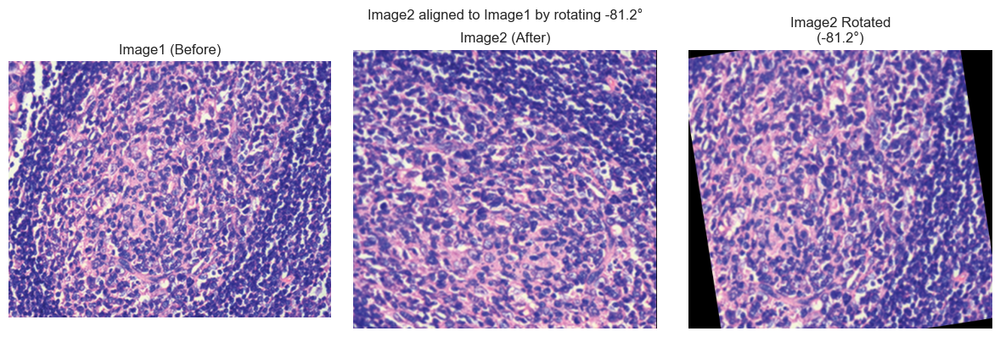

In [29]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# === Step 1: Load the two PNG images ===
image1_path = "image1.png"  # Before expansion
image2_path = "image2.png"  # After expansion

img1 = cv2.imread(image1_path)
img2 = cv2.imread(image2_path)

# === Step 2: Convert to grayscale and preprocess ===
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

gray1 = cv2.equalizeHist(gray1)
gray2 = cv2.equalizeHist(gray2)

gray1 = cv2.GaussianBlur(gray1, (5, 5), 0)
gray2 = cv2.GaussianBlur(gray2, (5, 5), 0)

# === Step 3: Thresholding to extract tissue region ===
_, bw1 = cv2.threshold(gray1, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
_, bw2 = cv2.threshold(gray2, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# === Step 4: Find contours and fit ellipse to get orientation ===
contours1, _ = cv2.findContours(bw1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours2, _ = cv2.findContours(bw2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if len(contours1) == 0 or len(contours2) == 0:
    raise ValueError("No contours found — check thresholding or image quality.")

largest_contour1 = max(contours1, key=cv2.contourArea)
largest_contour2 = max(contours2, key=cv2.contourArea)

ellipse1 = cv2.fitEllipse(largest_contour1)
ellipse2 = cv2.fitEllipse(largest_contour2)

_, _, angle1 = ellipse1
_, _, angle2 = ellipse2

# === Step 5: Compute rotation angle ===
rotation_angle = angle1 - angle2
print(f"Rotate image2 by {rotation_angle:.2f}° to match image1 orientation.")

# === Step 6: Rotate image2 to get aligned image3 ===
(h2, w2) = img2.shape[:2]
center = (w2 // 2, h2 // 2)

M = cv2.getRotationMatrix2D(center, rotation_angle, 1.0)
image3 = cv2.warpAffine(img2, M, (w2, h2))

# === Step 7: Plot the images ===
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title("Image1 (Before)")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.title("Image2 (After)")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(image3, cv2.COLOR_BGR2RGB))
plt.title(f"Image2 Rotated\n({rotation_angle:.1f}°)")
plt.axis('off')

plt.suptitle(f"Image2 aligned to Image1 by rotating {rotation_angle:.1f}°", fontsize=12)
plt.tight_layout()
plt.show()


Coarse rotation: 121.57°, Refinement rotation: 148.32°
Total rotation applied: 269.88°


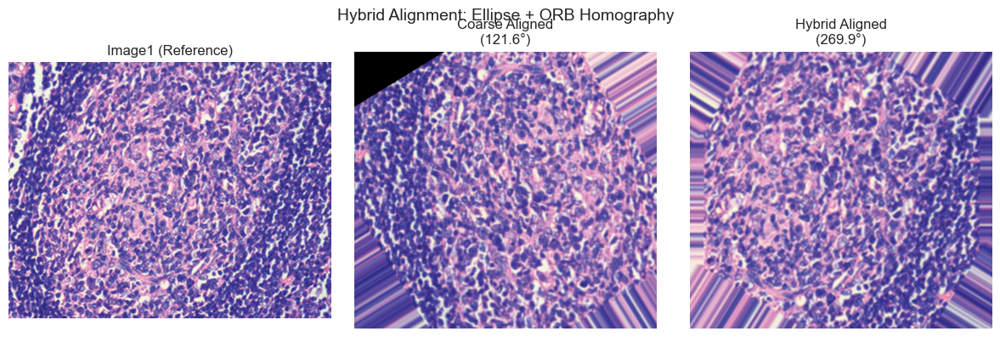

In [30]:
# Update to version 0.1
import cv2
import numpy as np
import matplotlib.pyplot as plt

def hybrid_align(image1_path, image2_path):
    """
    Hybrid alignment of two H&E images:
    1. Coarse global rotation via ellipse-fitting on the largest contour.
    2. Fine local adjustment via ORB feature matching + homography.
    Returns: final aligned image3, total rotation applied (coarse + refine).
    """
    # --- Step 1: Load images in BGR then convert to RGB for display ---
    img1 = cv2.imread(image1_path)
    img2 = cv2.imread(image2_path)
    img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

    # --- Step 2: Preprocess for contour-based orientation ---
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.equalizeHist(gray2)
    gray2 = cv2.GaussianBlur(gray2, (5,5), 0)
    _, bw2 = cv2.threshold(gray2, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Find largest contour in image2 and fit ellipse
    cnts = cv2.findContours(bw2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
    if not cnts:
        raise RuntimeError("No contours found for coarse alignment.")
    largest = max(cnts, key=cv2.contourArea)
    ellipse = cv2.fitEllipse(largest)
    _, _, angle_coarse = ellipse  # degrees

    # --- Step 3: Coarse rotate image2 by angle_coarse to get img2_coarse ---
    h2, w2 = img2.shape[:2]
    center2 = (w2/2, h2/2)
    M_coarse = cv2.getRotationMatrix2D(center2, angle_coarse, 1.0)
    img2_coarse = cv2.warpAffine(img2, M_coarse, (w2, h2), borderMode=cv2.BORDER_REPLICATE)
    img2_coarse_rgb = cv2.cvtColor(img2_coarse, cv2.COLOR_BGR2RGB)

    # --- Step 4: Fine-tune with ORB + homography between img1 and img2_coarse ---
    # Convert both to grayscale and denoise
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray1 = cv2.equalizeHist(gray1)
    gray1 = cv2.medianBlur(gray1, 5)
    gray_coarse = cv2.cvtColor(img2_coarse, cv2.COLOR_BGR2GRAY)
    gray_coarse = cv2.equalizeHist(gray_coarse)
    gray_coarse = cv2.medianBlur(gray_coarse, 5)

    # Detect ORB keypoints & descriptors
    orb = cv2.ORB_create(nfeatures=1000)
    k1, d1 = orb.detectAndCompute(gray1, None)
    k2, d2 = orb.detectAndCompute(gray_coarse, None)

    # Match with BFMatcher Hamming + crossCheck
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(d1, d2)
    matches = sorted(matches, key=lambda m: m.distance)
    keep = max(10, int(len(matches)*0.15))
    good = matches[:keep]

    # Build point arrays for homography
    src = np.float32([ k1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    dst = np.float32([ k2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
    H, mask = cv2.findHomography(src, dst, cv2.RANSAC, 5.0)
    if H is None:
        raise RuntimeError("Homography estimation failed for refinement.")

    # Extract fine rotation from H
    angle_refine = np.degrees(np.arctan2(H[1,0], H[0,0]))

    # --- Step 5: Apply fine rotation to img2_coarse to get final img3 ---
    M_refine = cv2.getRotationMatrix2D(center2, angle_refine, 1.0)
    img3 = cv2.warpAffine(img2_coarse, M_refine, (w2, h2), borderMode=cv2.BORDER_REPLICATE)
    img3_rgb = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

    total_angle = angle_coarse + angle_refine
    print(f"Coarse rotation: {angle_coarse:.2f}°, Refinement rotation: {angle_refine:.2f}°")
    print(f"Total rotation applied: {total_angle:.2f}°")

    # --- Step 6: Plot results side-by-side ---
    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1)
    plt.imshow(img1_rgb)
    plt.title("Image1 (Reference)")
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.imshow(img2_coarse_rgb)
    plt.title(f"Coarse Aligned\n({angle_coarse:.1f}°)")
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.imshow(img3_rgb)
    plt.title(f"Hybrid Aligned\n({total_angle:.1f}°)")
    plt.axis('off')

    plt.suptitle("Hybrid Alignment: Ellipse + ORB Homography", fontsize=14)
    plt.tight_layout()
    plt.show()

    return img3, total_angle

# Example usage
image3, angle = hybrid_align(
    "image1.png",
    "image2.png"
)


# Try Qwen's method
Angle error is too too too large

Estimated rotation angle: -5.23 degrees


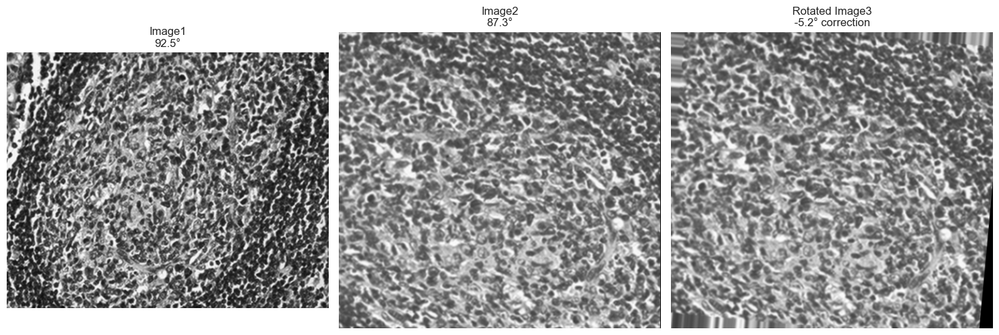

In [22]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def load_image(path):
    """Load image and convert to grayscale"""
    img = cv2.imread(path, 0)  # 0 = grayscale
    return img

def preprocess(img):
    """Denoise and enhance edges"""
    img = cv2.GaussianBlur(img, (5,5), 0)  # Reduce noise
    img = cv2.Canny(img, 50, 150)  # Edge detection
    return img

def get_orientation(img):
    """Extract orientation using PCA"""
    # Get coordinates of non-zero pixels
    coords = np.column_stack(np.where(img > 0))
    
    # Apply PCA
    pca = PCA(n_components=2)
    pca.fit(coords)
    
    # Get first principal component (main orientation)
    vector = pca.components_[0]
    
    # Calculate angle in degrees
    angle = np.arctan2(vector[1], vector[0]) * 180 / np.pi
    
    return angle, coords

def rotate_image(img, angle, center=None):
    """Rotate image around center point"""
    (h, w) = img.shape[:2]
    if center is None:
        center = (w//2, h//2)
    
    # Create rotation matrix
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    
    # Perform rotation
    rotated = cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_LINEAR, 
                            borderMode=cv2.BORDER_REPLICATE)
    return rotated

# 1. Read images
image1 = load_image('image1.png')
image2 = load_image('image2.png')

# 2. Preprocess and extract orientation
img1_proc = preprocess(image1)
angle1, coords1 = get_orientation(img1_proc)

img2_proc = preprocess(image2)
angle2, coords2 = get_orientation(img2_proc)

# 3. Calculate relative rotation angle
rotation_angle = angle2 - angle1
print(f"Estimated rotation angle: {rotation_angle:.2f} degrees")

# 4. Rotate image2 to match image1 orientation
image3 = rotate_image(image2, rotation_angle)

# 5. Plot results
plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(image1, cmap='gray')
plt.title(f'Image1\n{angle1:.1f}°')
plt.axis('off')

plt.subplot(132)
plt.imshow(image2, cmap='gray')
plt.title(f'Image2\n{angle2:.1f}°')
plt.axis('off')

plt.subplot(133)
plt.imshow(image3, cmap='gray')
plt.title(f'Rotated Image3\n{rotation_angle:.1f}° correction')
plt.axis('off')

plt.tight_layout()
plt.show()

# Try Kimi's method
Angle error is too large

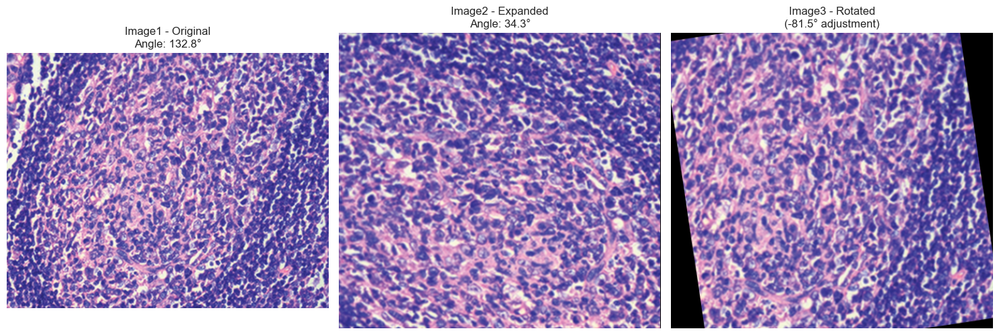

In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def compute_angle(img):
    """Compute orientation angle of tissue sample in image"""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)  # Denoise
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Invert threshold if tissue is dark on light background
    if np.mean(thresh) > 127:
        thresh = 255 - thresh
    
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:  # Handle empty case
        return 0
    
    # Find largest contour (assuming tissue is main object)
    largest_contour = max(contours, key=cv2.contourArea)
    moments = cv2.moments(largest_contour)
    
    # Calculate angle from central moments
    angle_rad = 0.5 * np.arctan2(2 * moments['mu11'], 
                               moments['mu20'] - moments['mu02'])
    angle_deg = np.degrees(angle_rad)
    
    # Normalize to 0-180 range
    return angle_deg % 180

# Read images
image1 = cv2.imread('image1.png')
image2 = cv2.imread('image2.png')

# Calculate angles for both images
angle1 = compute_angle(image1)
angle2 = compute_angle(image2)

# Calculate rotation angle (image2 to image1 orientation)
rotation_angle = (angle1 - angle2) % 180
if rotation_angle > 90:
    rotation_angle -= 180

# Rotate image2 to match image1 orientation
(h, w) = image2.shape[:2]
center = (w // 2, h // 2)
M = cv2.getRotationMatrix2D(center, rotation_angle, 1.0)
image3 = cv2.warpAffine(image2, M, (w, h))

# Display results
plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
plt.title(f'Image1 - Original\nAngle: {angle1:.1f}°')
plt.axis('off')

plt.subplot(132)
plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
plt.title(f'Image2 - Expanded\nAngle: {angle2:.1f}°')
plt.axis('off')

plt.subplot(133)
plt.imshow(cv2.cvtColor(image3, cv2.COLOR_BGR2RGB))
plt.title(f'Image3 - Rotated\n({rotation_angle:.1f}° adjustment)')
plt.axis('off')

plt.tight_layout()
plt.show()

# Try You.com's method

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import filters
from skimage.feature import canny
from scipy.ndimage import gaussian_filter

def preprocess_image(image):
    """
    Preprocess the image by applying denoising and enhancement
    """
    # Convert to grayscale if the image is in color
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image.copy()
    
    # Apply Gaussian denoising
    denoised = gaussian_filter(gray, sigma=1)
    
    # Enhance contrast using histogram equalization
    enhanced = cv2.equalizeHist(denoised.astype(np.uint8))
    
    return enhanced

def detect_orientation(image):
    """
    Detect orientation using SIFT features and principal component analysis
    """
    # Create SIFT detector
    sift = cv2.SIFT_create()
    
    # Detect keypoints
    keypoints, _ = sift.detectAndCompute(image, None)
    
    # Extract keypoint coordinates
    if len(keypoints) < 2:
        return 0
    
    points = np.float32([kp.pt for kp in keypoints])
    
    # Calculate principal components
    mean, eigenvectors = cv2.PCACompute2(points, mean=None)
    
    # Calculate orientation angle in degrees
    angle = np.degrees(np.arctan2(eigenvectors[0][1], eigenvectors[0][0]))
    
    return angle

def calculate_rotation_angle(angle1, angle2):
    """
    Calculate the rotation angle needed to align image2 with image1
    """
    rotation_angle = angle1 - angle2
    
    # Normalize angle to be between -180 and 180 degrees
    if rotation_angle > 180:
        rotation_angle -= 360
    elif rotation_angle < -180:
        rotation_angle += 360
        
    return rotation_angle

def rotate_image(image, angle):
    """
    Rotate image while keeping the entire image visible
    """
    # Get image dimensions
    height, width = image.shape[:2]
    
    # Calculate the center of the image
    center = (width // 2, height // 2)
    
    # Calculate rotation matrix
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    
    # Calculate new image dimensions
    abs_cos = abs(rotation_matrix[0, 0])
    abs_sin = abs(rotation_matrix[0, 1])
    new_width = int(height * abs_sin + width * abs_cos)
    new_height = int(height * abs_cos + width * abs_sin)
    
    # Adjust rotation matrix
    rotation_matrix[0, 2] += new_width/2 - center[0]
    rotation_matrix[1, 2] += new_height/2 - center[1]
    
    # Perform rotation
    rotated = cv2.warpAffine(image, rotation_matrix, (new_width, new_height))
    
    return rotated

# Main execution
if __name__ == "__main__":
    # 1. Read images
    image1 = cv2.imread('image1.png')
    image2 = cv2.imread('image2.png')
    
    # Convert BGR to RGB for matplotlib display
    image1_rgb = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
    image2_rgb = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
    
    # 2. Preprocess images and detect orientation
    processed1 = preprocess_image(image1)
    processed2 = preprocess_image(image2)
    
    angle1 = detect_orientation(processed1)
    angle2 = detect_orientation(processed2)
    
    # 3. Calculate rotation angle
    rotation_angle = calculate_rotation_angle(angle1, angle2)
    
    # 4. Rotate image2 to match image1's orientation
    image3 = rotate_image(image2, rotation_angle)
    image3_rgb = cv2.cvtColor(image3, cv2.COLOR_BGR2RGB)
    
    # 5. Plot results
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Plot image1
    axes[0].imshow(image1_rgb)
    axes[0].set_title(f'Image 1\nOrientation: {angle1:.1f}°')
    axes[0].axis('off')
    
    # Plot image2
    axes[1].imshow(image2_rgb)
    axes[1].set_title(f'Image 2\nOrientation: {angle2:.1f}°')
    axes[1].axis('off')
    
    # Plot image3
    axes[2].imshow(image3_rgb)
    axes[2].set_title(f'Image 3\nRotation: {rotation_angle:.1f}°')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()


ValueError: too many values to unpack (expected 2)